In [2]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

2022-11-08 12:38:20.357298: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/rayed/anaconda3/envs/tf/lib/:/home/rayed/anaconda3/envs/tf/lib/
2022-11-08 12:38:20.357333: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/rayed/anaconda3/envs/tf/lib/:/home/rayed/anaconda3/envs/tf/lib/
2022-11-08 12:38:20.357337: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [227]:
import os, shutil, pathlib

original_dir = pathlib.Path('dogs-vs-cats/train')
base_dir = pathlib.Path('dogs-vs-cats/small')

def make_subset(subset_name, start_index, end_index):
    for category in ('cat', 'dog'):
        dir = base_dir / subset_name / category
        os.makedirs(dir) 
        fnames = [f'{category}.{i}.jpg' for i in range(start_index, end_index)]
        for fname in fnames:
            shutil.copyfile(original_dir / fname, dir / fname)

make_subset('train', start_index=0, end_index=1000)
make_subset('val', start_index=1000, end_index=1500)
make_subset('test', start_index=1500, end_index=2500)

FileExistsError: [Errno 17] File exists: 'dogs-vs-cats/small/train/cat'

In [6]:
test_image = base_dir / 'train' / 'dog' / 'dog.0.jpg'
img = mpimg.imread(test_image)
img.shape

(375, 499, 3)

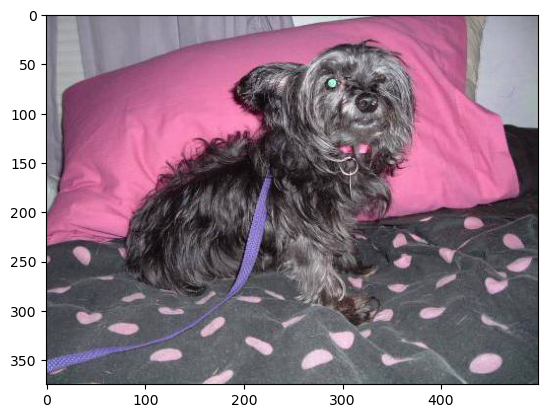

In [7]:
plt.imshow(img)

In [47]:
inputs = keras.Input(shape=(180, 180, 3))
x = keras.layers.Rescaling(1./255)(inputs)
x = keras.layers.Conv2D(32, 3, activation='relu')(x)
x = keras.layers.MaxPooling2D(2)(x)
x = keras.layers.Conv2D(64, 3, activation='relu')(x)
x = keras.layers.MaxPooling2D(2)(x)
x = keras.layers.Conv2D(128, 3, activation='relu')(x)
x = keras.layers.MaxPooling2D(2)(x)
x = keras.layers.Conv2D(256, 3, activation='relu')(x)
x = keras.layers.MaxPooling2D(2)(x)
x = keras.layers.Conv2D(256, 3, activation='relu')(x)
x = keras.layers.Flatten()(x)
outputs = keras.layers.Dense(1, activation='sigmoid')(x)
model = keras.Model(inputs, outputs)

In [48]:
model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 rescaling_5 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_19 (Conv2D)          (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 89, 89, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 87, 87, 64)        18496     
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 43, 43, 64)       0         
 g2D)                                                      

In [49]:
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

In [229]:
from tensorflow.keras.utils import image_dataset_from_directory

train_dataset = image_dataset_from_directory(
    base_dir / 'train',
    image_size=(180, 180),
    batch_size=128)
validation_dataset = image_dataset_from_directory(
    base_dir / 'val',
    image_size=(180, 180),
    batch_size=128)
test_dataset = image_dataset_from_directory(
    base_dir / 'test',
    image_size=(180, 180),
    batch_size=128)

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.


In [52]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath='models/dogs-vs-cats/convnet_from_scratch.keras',
        monitor='val_loss',
        save_best_only=True)
]
history = model.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=callbacks
)

Epoch 1/30
32/32 [==============================] - 2s 39ms/step - loss: 0.8874 - accuracy: 0.5300 - val_loss: 0.7986 - val_accuracy: 0.5000
Epoch 2/30
32/32 [==============================] - 1s 39ms/step - loss: 0.7200 - accuracy: 0.5275 - val_loss: 0.6867 - val_accuracy: 0.5960
Epoch 3/30
32/32 [==============================] - 1s 38ms/step - loss: 0.6875 - accuracy: 0.5350 - val_loss: 0.6683 - val_accuracy: 0.5630
Epoch 4/30
32/32 [==============================] - 1s 35ms/step - loss: 0.6815 - accuracy: 0.5495 - val_loss: 0.6851 - val_accuracy: 0.5840
Epoch 5/30
32/32 [==============================] - 1s 37ms/step - loss: 0.6807 - accuracy: 0.5870 - val_loss: 0.6608 - val_accuracy: 0.6070
Epoch 6/30
32/32 [==============================] - 1s 37ms/step - loss: 0.6419 - accuracy: 0.6410 - val_loss: 0.6245 - val_accuracy: 0.6750
Epoch 7/30
32/32 [==============================] - 1s 37ms/step - loss: 0.6097 - accuracy: 0.6855 - val_loss: 0.6410 - val_accuracy: 0.6300
Epoch 8/30
32

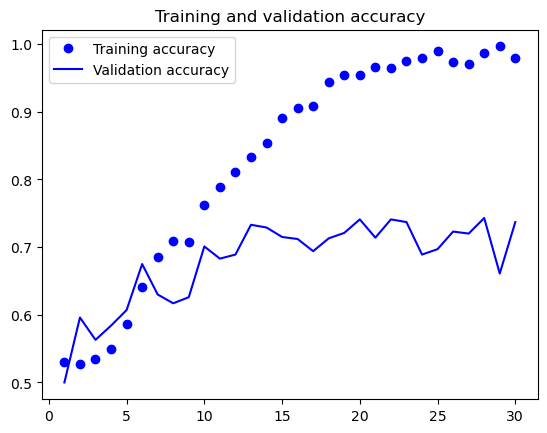

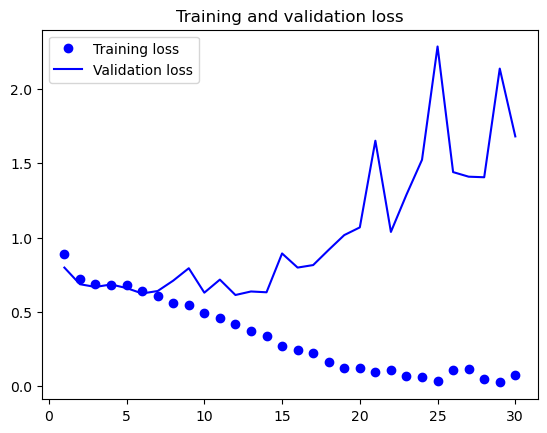

In [53]:
import matplotlib.pyplot as plt
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, "bo", label="Training accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [54]:
test_model = keras.models.load_model("models/dogs-vs-cats/convnet_from_scratch.keras")
test_loss, test_acc = test_model.evaluate(test_dataset) 
print(f"Test accuracy: {test_acc:.3f}")

32/32 [==============================] - 1s 15ms/step - loss: 0.6259 - accuracy: 0.6820
Test accuracy: 0.682


In [57]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.2),
    ]
)

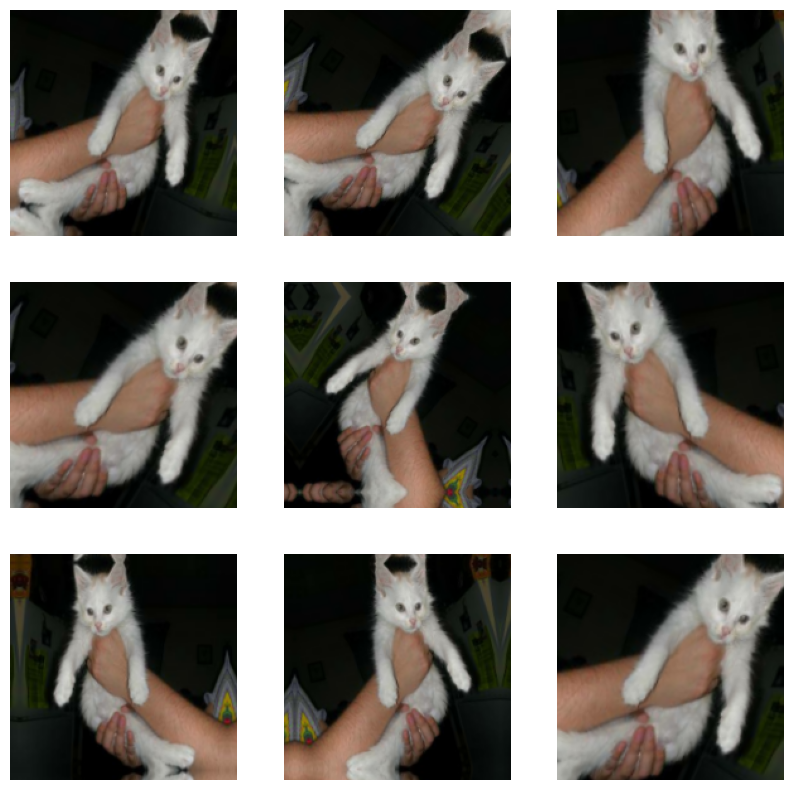

In [58]:
plt.figure(figsize=(10, 10)) 
for images, _ in train_dataset.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

In [59]:
inputs = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)
x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs=inputs, outputs=outputs)
  
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

In [60]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="models/dogs-vs-cats/convnet_from_scratch_with_augmentation.keras",
        save_best_only=True,
        monitor="val_loss")
]
history = model.fit(
    train_dataset,
    epochs=100,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/100
32/32 [==============================] - 6s 138ms/step - loss: 0.6967 - accuracy: 0.5120 - val_loss: 0.6923 - val_accuracy: 0.5020
Epoch 2/100
32/32 [==============================] - 4s 138ms/step - loss: 0.7058 - accuracy: 0.5330 - val_loss: 0.6658 - val_accuracy: 0.6310
Epoch 3/100
32/32 [==============================] - 4s 136ms/step - loss: 0.6822 - accuracy: 0.5980 - val_loss: 0.6827 - val_accuracy: 0.5820
Epoch 4/100
32/32 [==============================] - 4s 131ms/step - loss: 0.6974 - accuracy: 0.6080 - val_loss: 0.6417 - val_accuracy: 0.6450
Epoch 5/100
32/32 [==============================] - 4s 131ms/step - loss: 0.6654 - accuracy: 0.6380 - val_loss: 0.6318 - val_accuracy: 0.6310
Epoch 6/100
32/32 [==============================] - 4s 135ms/step - loss: 0.6307 - accuracy: 0.6480 - val_loss: 0.6492 - val_accuracy: 0.6020
Epoch 7/100
32/32 [==============================] - 5s 140ms/step - loss: 0.6286 - accuracy: 0.6510 - val_loss: 0.6103 - val_accuracy: 0.6610

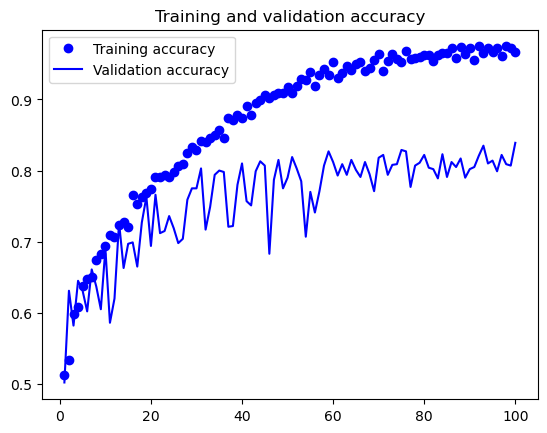

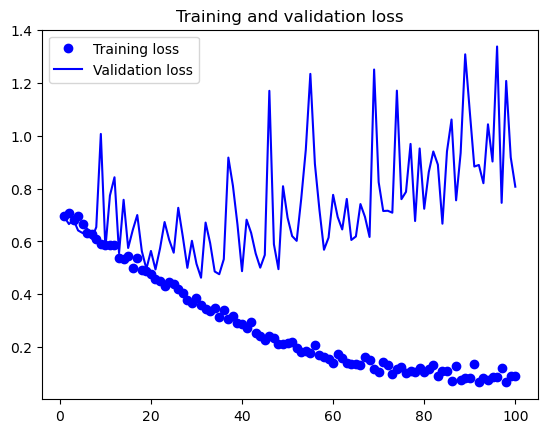

In [61]:
import matplotlib.pyplot as plt
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, "bo", label="Training accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [64]:
test_model = keras.models.load_model(
    "models/dogs-vs-cats/convnet_from_scratch_with_augmentation.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

32/32 [==============================] - 1s 17ms/step - loss: 0.5163 - accuracy: 0.7790
Test accuracy: 0.779


In [70]:
conv_base = keras.applications.vgg16.VGG16(
    weights="imagenet",
    include_top=False,
    input_shape=(180, 180, 3))

In [71]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

In [73]:
import numpy as np

def get_features_and_label(dataset):
    all_features = []
    all_labels = []
    for images, labels in dataset:
        preprocessed_images = keras.applications.vgg16.preprocess_input(images)
        features = conv_base.predict(preprocessed_images)
        all_features.append(features)
        all_labels.append(labels)
    return np.concatenate(all_features), np.concatenate(all_labels)

train_features, train_labels = get_features_and_label(train_dataset)
val_features, val_labels = get_features_and_label(validation_dataset)
test_features, test_labels = get_features_and_label(test_dataset)

1/1 [==============================] - 0s 11ms/step


In [74]:
train_features.shape

(2000, 5, 5, 512)

In [75]:
inputs = keras.Input(shape=(5, 5, 512))
x = layers.Flatten()(inputs)
x = layers.Dense(256)(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])
  
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="models/dogs-vs-cats/feature_extraction.keras",
        save_best_only=True,
        monitor="val_loss")
]
history = model.fit(
    train_features, train_labels,
    epochs=20,
    validation_data=(val_features, val_labels),
    callbacks=callbacks)

Epoch 1/20
63/63 [==============================] - 0s 3ms/step - loss: 23.9030 - accuracy: 0.9050 - val_loss: 6.2638 - val_accuracy: 0.9580
Epoch 2/20
63/63 [==============================] - 0s 3ms/step - loss: 3.3664 - accuracy: 0.9805 - val_loss: 3.7059 - val_accuracy: 0.9730
Epoch 3/20
63/63 [==============================] - 0s 4ms/step - loss: 1.7914 - accuracy: 0.9895 - val_loss: 6.8441 - val_accuracy: 0.9630
Epoch 4/20
63/63 [==============================] - 0s 3ms/step - loss: 1.2910 - accuracy: 0.9885 - val_loss: 6.0309 - val_accuracy: 0.9700
Epoch 5/20
63/63 [==============================] - 0s 4ms/step - loss: 1.2554 - accuracy: 0.9885 - val_loss: 3.2399 - val_accuracy: 0.9810
Epoch 6/20
63/63 [==============================] - 0s 3ms/step - loss: 0.7638 - accuracy: 0.9945 - val_loss: 8.2581 - val_accuracy: 0.9680
Epoch 7/20
63/63 [==============================] - 0s 4ms/step - loss: 1.0886 - accuracy: 0.9950 - val_loss: 4.4257 - val_accuracy: 0.9820
Epoch 8/20
63/63 [=

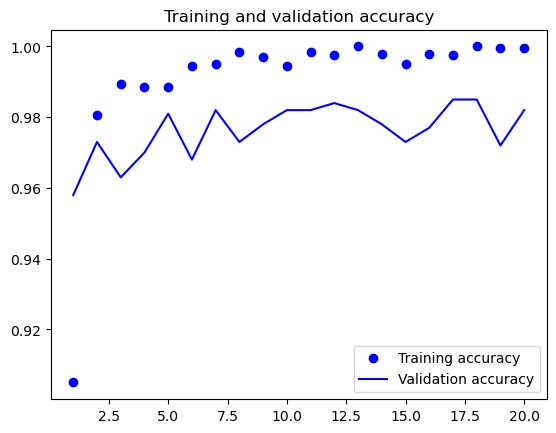

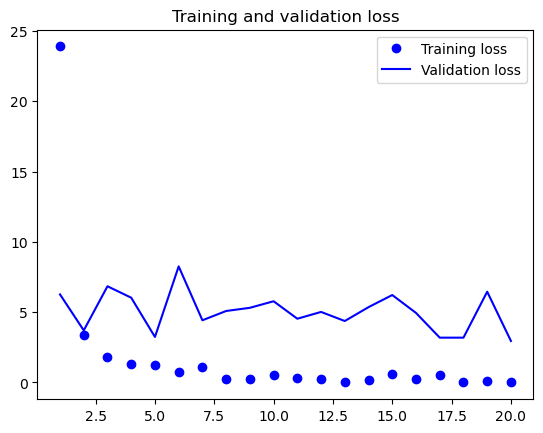

In [76]:
import matplotlib.pyplot as plt
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, "bo", label="Training accuracy")
plt.plot(epochs, val_acc, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [77]:
conv_base  = keras.applications.vgg16.VGG16(
    weights="imagenet",
    include_top=False)
conv_base.trainable = False

In [79]:
conv_base.trainable = True
print("This is the number of trainable weights " 
        "before freezing the conv base:", len(conv_base.trainable_weights))
conv_base.trainable = False
print("This is the number of trainable weights " 
        "after freezing the conv base:", len(conv_base.trainable_weights))

This is the number of trainable weights before freezing the conv base: 26
This is the number of trainable weights after freezing the conv base: 0


In [80]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.2),
    ]
)
  
inputs = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)
x = keras.applications.vgg16.preprocess_input(x)
x = conv_base(x)
x = layers.Flatten()(x)
x = layers.Dense(256)(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

In [81]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="models/dogs-vs-cats/feature_extraction_with_data_augmentation.keras",
        save_best_only=True,
        monitor="val_loss")
]
history = model.fit(
    train_dataset,
    epochs=50,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/50
32/32 [==============================] - 11s 256ms/step - loss: 25.0405 - accuracy: 0.8840 - val_loss: 3.3693 - val_accuracy: 0.9730
Epoch 2/50
32/32 [==============================] - 7s 210ms/step - loss: 5.9165 - accuracy: 0.9440 - val_loss: 4.8653 - val_accuracy: 0.9660
Epoch 3/50
32/32 [==============================] - 7s 204ms/step - loss: 3.7430 - accuracy: 0.9625 - val_loss: 3.4720 - val_accuracy: 0.9710
Epoch 4/50
32/32 [==============================] - 7s 206ms/step - loss: 4.1640 - accuracy: 0.9580 - val_loss: 4.6612 - val_accuracy: 0.9670
Epoch 5/50
32/32 [==============================] - 7s 212ms/step - loss: 2.6536 - accuracy: 0.9745 - val_loss: 3.0793 - val_accuracy: 0.9750
Epoch 6/50
32/32 [==============================] - 7s 211ms/step - loss: 3.7697 - accuracy: 0.9675 - val_loss: 3.7805 - val_accuracy: 0.9710
Epoch 7/50
32/32 [==============================] - 7s 213ms/step - loss: 1.8425 - accuracy: 0.9795 - val_loss: 6.0061 - val_accuracy: 0.9650
Epoc

In [82]:
def plot_metrics(history):
    import matplotlib.pyplot as plt
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    epochs = range(1, len(acc) + 1)
    plt.plot(epochs, acc, "bo", label="Training accuracy")
    plt.plot(epochs, val_acc, "b", label="Validation accuracy")
    plt.title("Training and validation accuracy")
    plt.legend()
    plt.figure()
    plt.plot(epochs, loss, "bo", label="Training loss")
    plt.plot(epochs, val_loss, "b", label="Validation loss")
    plt.title("Training and validation loss")
    plt.legend()
    plt.show()

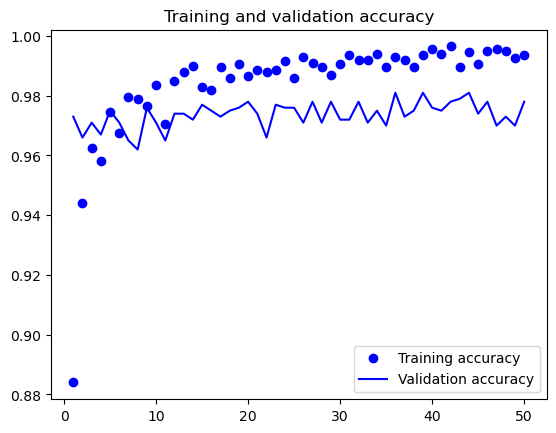

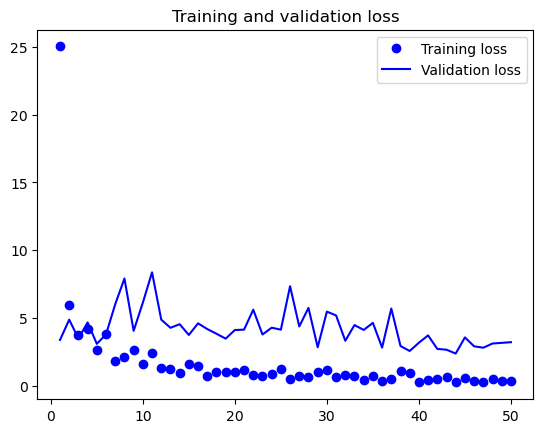

In [83]:
plot_metrics(history)

In [84]:
test_model = keras.models.load_model(
    "models/dogs-vs-cats/feature_extraction_with_data_augmentation.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

32/32 [==============================] - 2s 62ms/step - loss: 4.9453 - accuracy: 0.9680
Test accuracy: 0.968


In [85]:
conv_base.trainable = True
for layer in conv_base.layers[:-4]:
    layer.trainable = False

In [86]:
model.compile(loss="binary_crossentropy",
              optimizer=keras.optimizers.RMSprop(learning_rate=1e-5),
              metrics=["accuracy"])
  
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="models/dogs-vs-cats/fine_tuning.keras",
        save_best_only=True,
        monitor="val_loss")
]
history = model.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/30
32/32 [==============================] - 9s 225ms/step - loss: 0.3853 - accuracy: 0.9940 - val_loss: 2.7816 - val_accuracy: 0.9720
Epoch 2/30
32/32 [==============================] - 7s 212ms/step - loss: 0.4467 - accuracy: 0.9955 - val_loss: 2.6212 - val_accuracy: 0.9760
Epoch 3/30
32/32 [==============================] - 7s 216ms/step - loss: 0.2614 - accuracy: 0.9955 - val_loss: 3.2189 - val_accuracy: 0.9750
Epoch 4/30
32/32 [==============================] - 7s 217ms/step - loss: 0.4239 - accuracy: 0.9950 - val_loss: 3.7659 - val_accuracy: 0.9710
Epoch 5/30
32/32 [==============================] - 7s 213ms/step - loss: 0.5313 - accuracy: 0.9930 - val_loss: 3.8488 - val_accuracy: 0.9720
Epoch 6/30
32/32 [==============================] - 7s 222ms/step - loss: 0.2014 - accuracy: 0.9975 - val_loss: 3.5455 - val_accuracy: 0.9740
Epoch 7/30
32/32 [==============================] - 7s 229ms/step - loss: 0.1987 - accuracy: 0.9955 - val_loss: 3.0257 - val_accuracy: 0.9730
Epoch 

In [87]:
model = keras.models.load_model("models/dogs-vs-cats/fine_tuning.keras")
test_loss, test_acc = model.evaluate(test_dataset) 
print(f"Test accuracy: {test_acc:.3f}")

32/32 [==============================] - 2s 65ms/step - loss: 4.1561 - accuracy: 0.9755
Test accuracy: 0.975


In [88]:
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
!tar -xf images.tar.gz
!tar -xf annotations.tar.gz

/usr/bin/zsh: /home/rayed/anaconda3/envs/tf/lib/libtinfo.so.6: no version information available (required by /usr/bin/zsh)
wget: /home/rayed/anaconda3/envs/tf/lib/libuuid.so.1: no version information available (required by wget)
--2022-11-08 17:30:12--  http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz [following]
--2022-11-08 17:30:12--  https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://thor.robots.ox.ac.uk/~vgg/data/pets/images.tar.gz [following]
--2022-11-08 17:30:13--  https://thor.robots.ox.ac.uk/~vgg/data/pets/i

In [93]:
for fname in os.listdir(input_dir):
    if not fname.endswith('.jpg'):
        print(fname)

Abyssinian_101.mat
Abyssinian_102.mat
Abyssinian_100.mat


In [98]:
from pathlib import Path

input_dir = Path('pets/images/')
target_dir = Path('pets/annotations/trimaps')

input_img_paths = sorted([
    input_dir / fname for fname in os.listdir(input_dir) if fname.endswith('.jpg')
])
target_paths = sorted([
    target_dir / fname for fname in os.listdir(target_dir) 
        if fname.endswith('.png') and not fname.startswith('.')
])

In [99]:
len(input_img_paths), len(target_paths)

(7390, 7390)

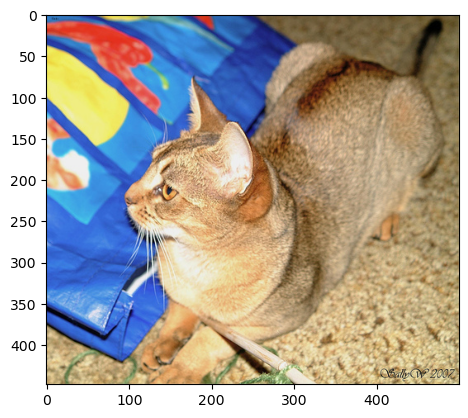

In [109]:
from keras.utils import load_img, img_to_array

plt.imshow(load_img(input_img_paths[9]))

In [113]:
target_image = load_img(target_paths[9])
target_array = img_to_array(target_image)
np.unique(target_array)

array([1., 2., 3.], dtype=float32)

In [115]:
target_array.shape

(448, 500, 3)

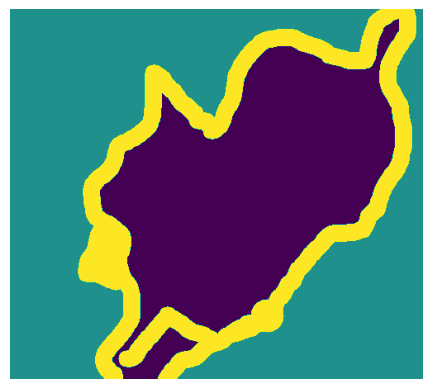

In [137]:
def display_target(target_array):
    normalized_array = (target_array.astype("uint8") - 1) * 127 
    plt.axis("off")
    plt.imshow(normalized_array)
  
img = img_to_array(load_img(target_paths[9], color_mode='grayscale'))
display_target(img)

In [138]:
img.shape

(448, 500, 1)

In [140]:
img = img_to_array(load_img(target_paths[9]))
img.shape

(448, 500, 3)

In [141]:
np.allclose(img[:,:,0], img[:,:,1])

True

In [142]:
import numpy as np 
import random 
  
img_size = (200, 200)
num_imgs = len(input_img_paths)
 
random.Random(1337).shuffle(input_img_paths)
random.Random(1337).shuffle(target_paths)
 
def path_to_input_image(path):
    return img_to_array(load_img(path, target_size=img_size))
  
def path_to_target(path):
    img = img_to_array(
        load_img(path, target_size=img_size, color_mode="grayscale"))
    img = img.astype("uint8") - 1
    return img
  
input_imgs = np.zeros((num_imgs,) + img_size + (3,), dtype="float32")
targets = np.zeros((num_imgs,) + img_size + (1,), dtype="uint8")
for i in range(num_imgs):
    input_imgs[i] = path_to_input_image(input_img_paths[i])
    targets[i] = path_to_target(target_paths[i])
 
num_val_samples = 1000
train_input_imgs = input_imgs[:-num_val_samples]
train_targets = targets[:-num_val_samples]
val_input_imgs = input_imgs[-num_val_samples:]
val_targets = targets[-num_val_samples:]

In [143]:
from tensorflow import keras 
from tensorflow.keras import layers
  
def get_model(img_size, num_classes):
    inputs = keras.Input(shape=img_size + (3,))
    x = layers.Rescaling(1./255)(inputs)
 
    x = layers.Conv2D(64, 3, strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
    x = layers.Conv2D(128, 3, strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2D(128, 3, activation="relu", padding="same")(x)
    x = layers.Conv2D(256, 3, strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)
  
    x = layers.Conv2DTranspose(256, 3, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(
        256, 3, activation="relu", padding="same", strides=2)(x)
    x = layers.Conv2DTranspose(128, 3, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(
        128, 3, activation="relu", padding="same", strides=2)(x)
    x = layers.Conv2DTranspose(64, 3, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(
        64, 3, activation="relu", padding="same", strides=2)(x)
  
    outputs = layers.Conv2D(num_classes, 3, activation="softmax",padding="same")(x)
 
    model = keras.Model(inputs, outputs)
    return model
  
model = get_model(img_size=img_size, num_classes=3)
model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 200, 200, 3)]     0         
                                                                 
 rescaling_7 (Rescaling)     (None, 200, 200, 3)       0         
                                                                 
 conv2d_29 (Conv2D)          (None, 100, 100, 64)      1792      
                                                                 
 conv2d_30 (Conv2D)          (None, 100, 100, 64)      36928     
                                                                 
 conv2d_31 (Conv2D)          (None, 50, 50, 128)       73856     
                                                                 
 conv2d_32 (Conv2D)          (None, 50, 50, 128)       147584    
                                                                 
 conv2d_33 (Conv2D)          (None, 25, 25, 256)       2951

In [144]:
model.compile(optimizer="rmsprop", loss="sparse_categorical_crossentropy")
  
callbacks = [
    keras.callbacks.ModelCheckpoint("models/pets/oxford_segmentation.keras",
                                    save_best_only=True)
]
  
history = model.fit(train_input_imgs, train_targets,
                    epochs=50,
                    callbacks=callbacks,
                    batch_size=64,
                    validation_data=(val_input_imgs, val_targets))

Epoch 1/50
100/100 [==============================] - 31s 252ms/step - loss: 1.3242 - val_loss: 0.8963
Epoch 2/50
100/100 [==============================] - 18s 181ms/step - loss: 0.9245 - val_loss: 0.8075
Epoch 3/50
100/100 [==============================] - 18s 177ms/step - loss: 0.8071 - val_loss: 0.7487
Epoch 4/50
100/100 [==============================] - 18s 176ms/step - loss: 0.7796 - val_loss: 0.9111
Epoch 5/50
100/100 [==============================] - 18s 176ms/step - loss: 0.7523 - val_loss: 0.6802
Epoch 6/50
100/100 [==============================] - 18s 177ms/step - loss: 0.6971 - val_loss: 0.6209
Epoch 7/50
100/100 [==============================] - 18s 178ms/step - loss: 0.6524 - val_loss: 0.5859
Epoch 8/50
100/100 [==============================] - 18s 178ms/step - loss: 0.6180 - val_loss: 0.5664
Epoch 9/50
100/100 [==============================] - 18s 177ms/step - loss: 0.5939 - val_loss: 0.5943
Epoch 10/50
100/100 [==============================] - 18s 177ms/step - l

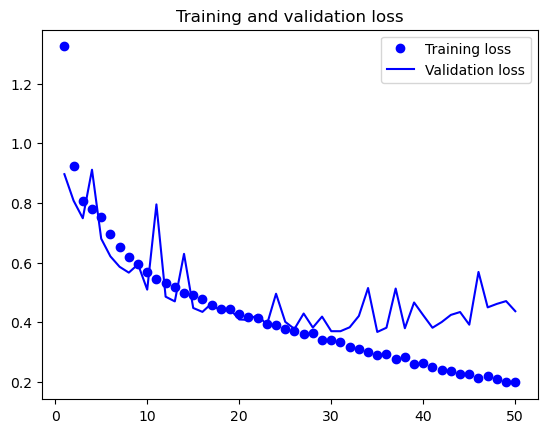

In [145]:
epochs = range(1, len(history.history["loss"]) + 1)
loss = history.history["loss"]
val_loss = history.history["val_loss"]
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()

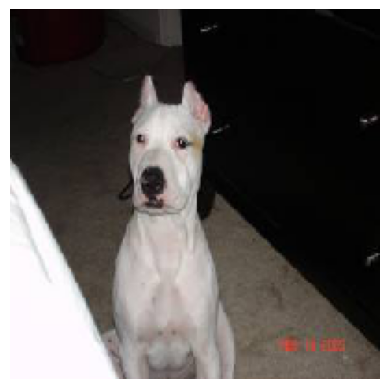

1/1 [==============================] - 0s 73ms/step


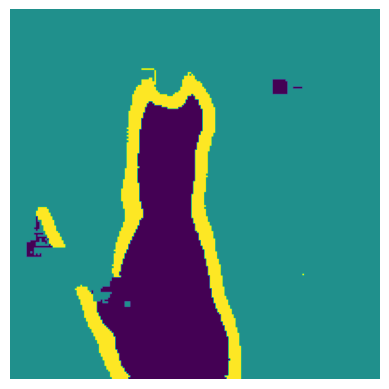

In [168]:
from tensorflow.keras.utils import array_to_img
  
model = keras.models.load_model("models/pets/oxford_segmentation.keras")
  
i = 4 
test_image = val_input_imgs[i]
plt.axis("off")
plt.imshow(array_to_img(test_image))
plt.show()
  
mask = model.predict(np.expand_dims(test_image, 0))[0]
  
def display_mask(pred):
    mask = np.argmax(pred, axis=-1, keepdims=True)
    mask *= 127 
    plt.axis("off")
    plt.imshow(mask)
  
display_mask(mask)

In [173]:
inputs = keras.Input(shape=(32, 32, 3))
x = layers.Rescaling(1./255)(inputs)
  
def residual_block(x, filters, pooling=False):
    residual = x
    x = layers.Conv2D(filters, 3, activation="relu", padding="same")(x)
    x = layers.Conv2D(filters, 3, activation="relu", padding="same")(x)
    if pooling:
        x = layers.MaxPooling2D(2, padding="same")(x)
        residual = layers.Conv2D(filters, 1, strides=2)(residual)
    elif filters != residual.shape[-1]:
        residual = layers.Conv2D(filters, 1)(residual)
    x = layers.add([x, residual])
    return x
  
x = residual_block(x, filters=32, pooling=True)
x = residual_block(x, filters=64, pooling=True)
x = residual_block(x, filters=128, pooling=False)
 
x = layers.GlobalAveragePooling2D()(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.summary()

Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_19 (InputLayer)          [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 rescaling_12 (Rescaling)       (None, 32, 32, 3)    0           ['input_19[0][0]']               
                                                                                                  
 conv2d_66 (Conv2D)             (None, 32, 32, 32)   896         ['rescaling_12[0][0]']           
                                                                                                  
 conv2d_67 (Conv2D)             (None, 32, 32, 32)   9248        ['conv2d_66[0][0]']              
                                                                                           

In [230]:
inputs = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)

x = layers.Rescaling(1./255)(x)
x = layers.Conv2D(32, 5, use_bias=False)(x) # (180, 180, 32)

for filters in [32, 64, 128, 256, 512]:
    residual = x
    
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, 3, padding='same', use_bias=False)(x) # (180, 180, 32)

    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, 3, padding='same', use_bias=False)(x) # (180, 180, 32)

    x = layers.MaxPooling2D(3, strides=2, padding='same')(x) # (90, 90, 32)

    residual = layers.Conv2D(filters, 1, strides=2, padding='same', use_bias=False)(residual)

    x = layers.add([x, residual])

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1, activation='sigmoid')(x)
model = tf.keras.models.Model(inputs, outputs)

In [231]:
model.summary()

Model: "model_23"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_48 (InputLayer)          [(None, 180, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential_1 (Sequential)      (None, 180, 180, 3)  0           ['input_48[0][0]']               
                                                                                                  
 rescaling_25 (Rescaling)       (None, 180, 180, 3)  0           ['sequential_1[13][0]']          
                                                                                                  
 conv2d_250 (Conv2D)            (None, 176, 176, 32  2400        ['rescaling_25[0][0]']    

In [232]:
train_dataset = train_dataset.shuffle(2046).cache().prefetch(tf.data.AUTOTUNE)
validation_dataset = validation_dataset.shuffle(2048).cache().prefetch(tf.data.AUTOTUNE)

In [240]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('models/dogs-vs-cats/residual-connection.keras', save_best_only=True, monitor='val_loss'),
    # tf.keras.callbacks.ReduceLROnPlateau(),
    # tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
]

model.compile(optimizer=tf.keras.optimizers.RMSprop(), loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(train_dataset, epochs=50, validation_data=validation_dataset, callbacks=callbacks)

Epoch 1/50
16/16 [==============================] - 10s 551ms/step - loss: 0.2719 - accuracy: 0.9060 - val_loss: 0.8971 - val_accuracy: 0.7680
Epoch 2/50
16/16 [==============================] - 9s 540ms/step - loss: 0.1625 - accuracy: 0.9425 - val_loss: 0.6629 - val_accuracy: 0.8150
Epoch 3/50
16/16 [==============================] - 9s 536ms/step - loss: 0.1356 - accuracy: 0.9505 - val_loss: 1.5032 - val_accuracy: 0.7250
Epoch 4/50
16/16 [==============================] - 9s 538ms/step - loss: 0.1546 - accuracy: 0.9445 - val_loss: 0.7861 - val_accuracy: 0.7600
Epoch 5/50
16/16 [==============================] - 9s 546ms/step - loss: 0.1628 - accuracy: 0.9390 - val_loss: 0.8157 - val_accuracy: 0.7390
Epoch 6/50
16/16 [==============================] - 9s 549ms/step - loss: 0.1156 - accuracy: 0.9515 - val_loss: 0.6410 - val_accuracy: 0.8220
Epoch 7/50
16/16 [==============================] - 9s 546ms/step - loss: 0.1347 - accuracy: 0.9535 - val_loss: 0.5009 - val_accuracy: 0.8260
Epoch

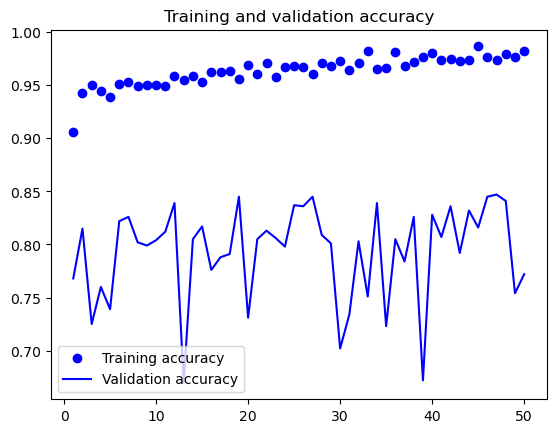

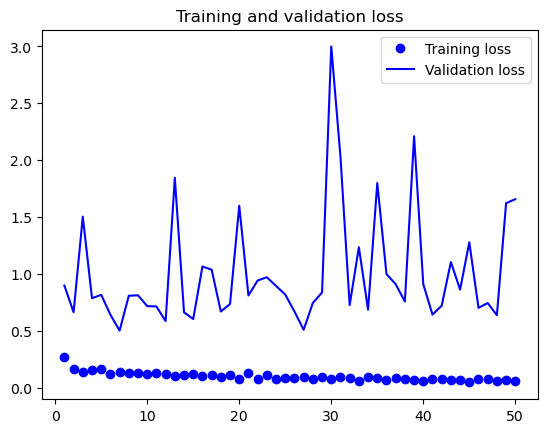

In [241]:
plot_metrics(history)

In [242]:
model = tf.keras.models.load_model('models/dogs-vs-cats/residual-connection.keras')
test_loss, test_acc = model.evaluate(test_dataset)
print(f'test accuracy={test_acc:.2f}')

16/16 [==============================] - 2s 92ms/step - loss: 0.5769 - accuracy: 0.8265
test accuracy=0.83


In [243]:
model = keras.models.load_model('models/dogs-vs-cats/convnet_from_scratch_with_augmentation.keras')
model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 rescaling_6 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_24 (Conv2D)          (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 89, 89, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_25 (Conv2D)          (None, 87, 87, 64)        18496     
                                                           

In [244]:
from tensorflow import keras 
import numpy as np
  
img_path = keras.utils.get_file(
    fname="cat.jpg",
    origin="https://img-datasets.s3.amazonaws.com/cat.jpg")
 
def get_img_array(img_path, target_size):
    img = keras.utils.load_img(
        img_path, target_size=target_size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array
  
img_tensor = get_img_array(img_path, target_size=(180, 180))

80329/80329 [==============================] - 0s 4us/step


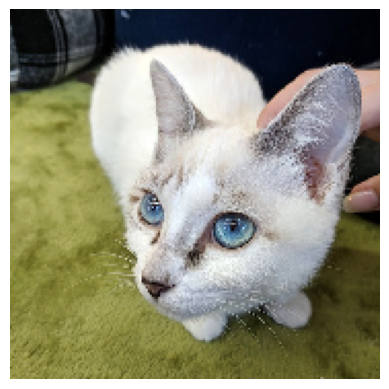

In [245]:
import matplotlib.pyplot as plt
plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

In [248]:
model.output

<KerasTensor: shape=(None, 1) dtype=float32 (created by layer 'dense_5')>

In [249]:
from tensorflow.keras import layers
  
layer_outputs = []
layer_names = [] 
for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

In [250]:
activations = activation_model.predict(img_tensor)

1/1 [==============================] - 0s 78ms/step


In [251]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)


(1, 178, 178, 32)


In [254]:
layer_names[0]

'conv2d_24'

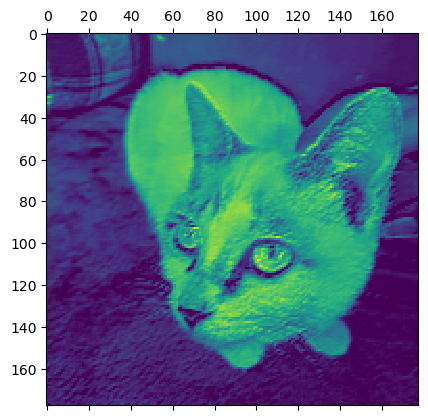

In [252]:
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0, :, :, 5], cmap="viridis")

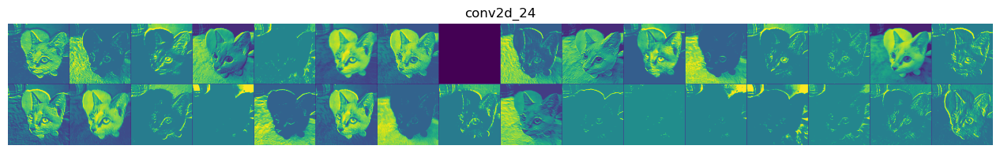

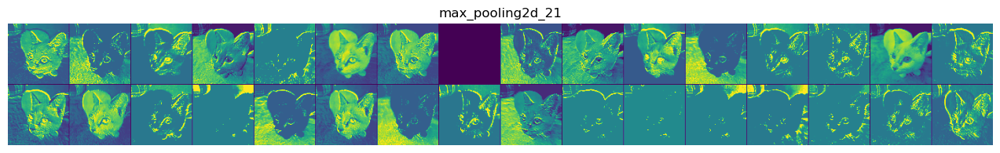

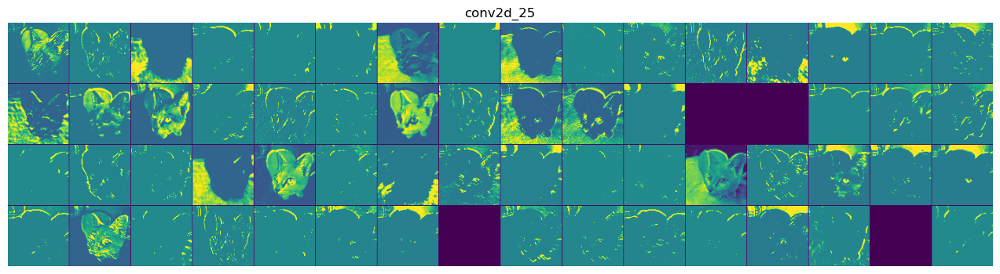

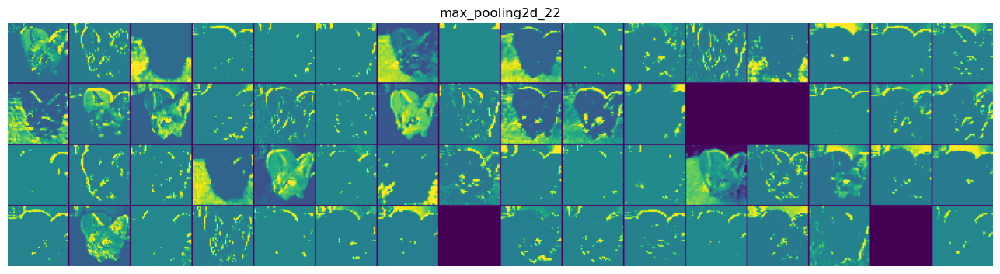

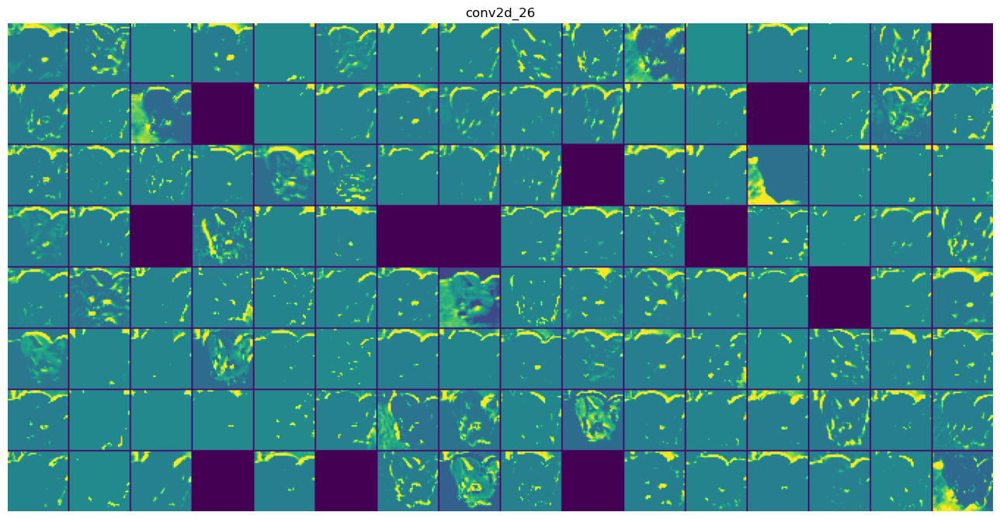

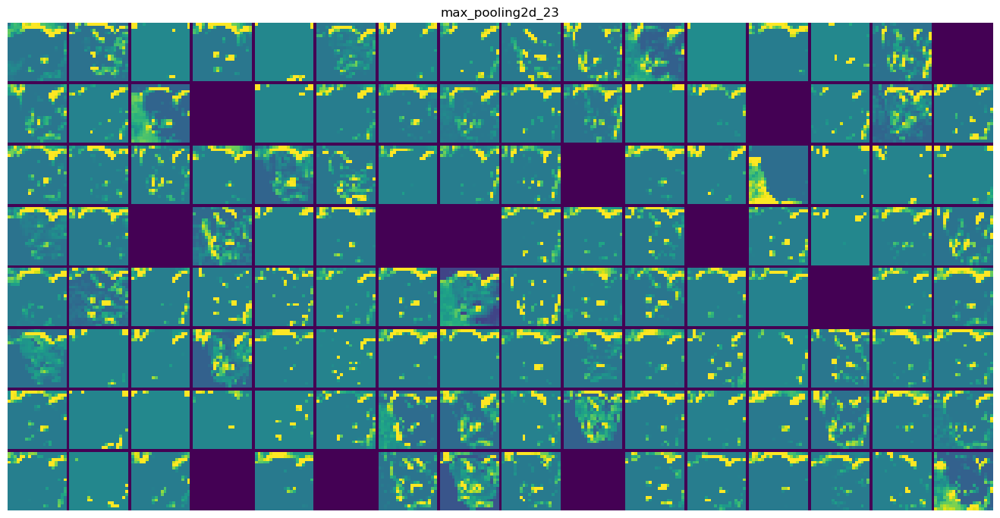

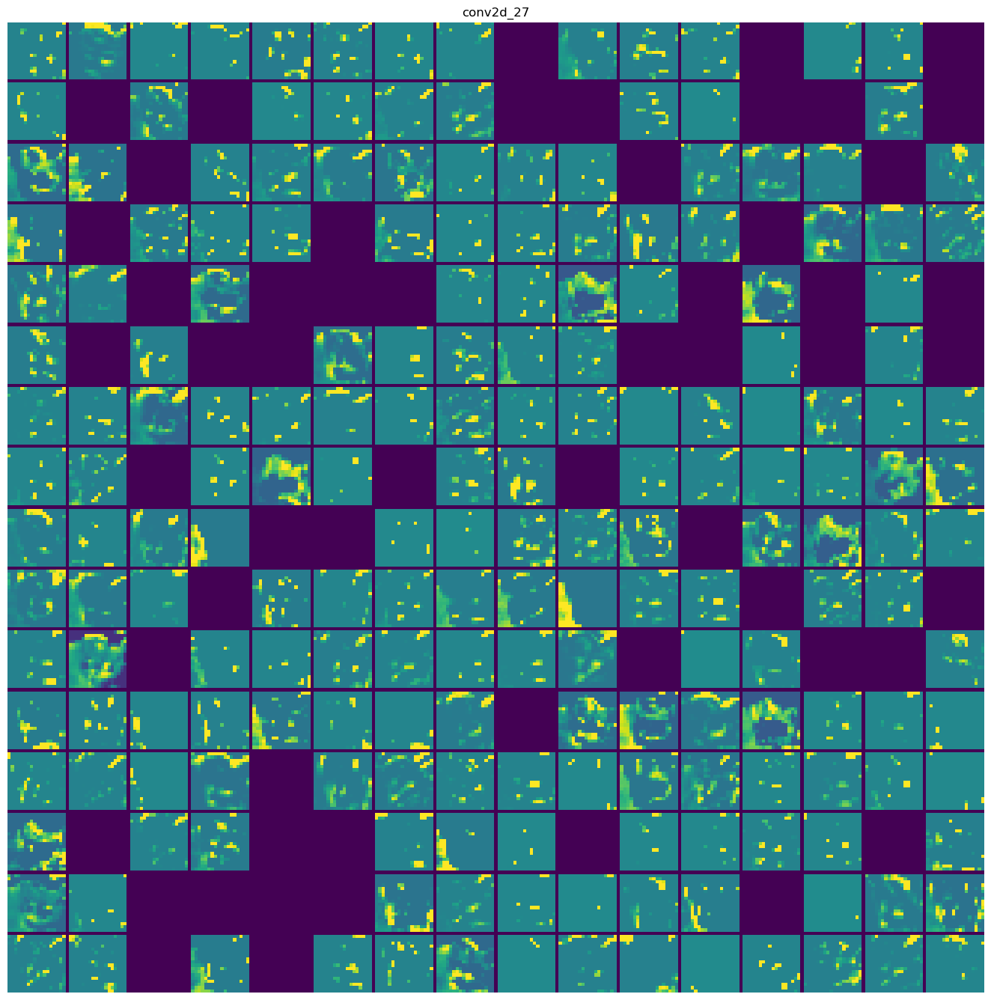

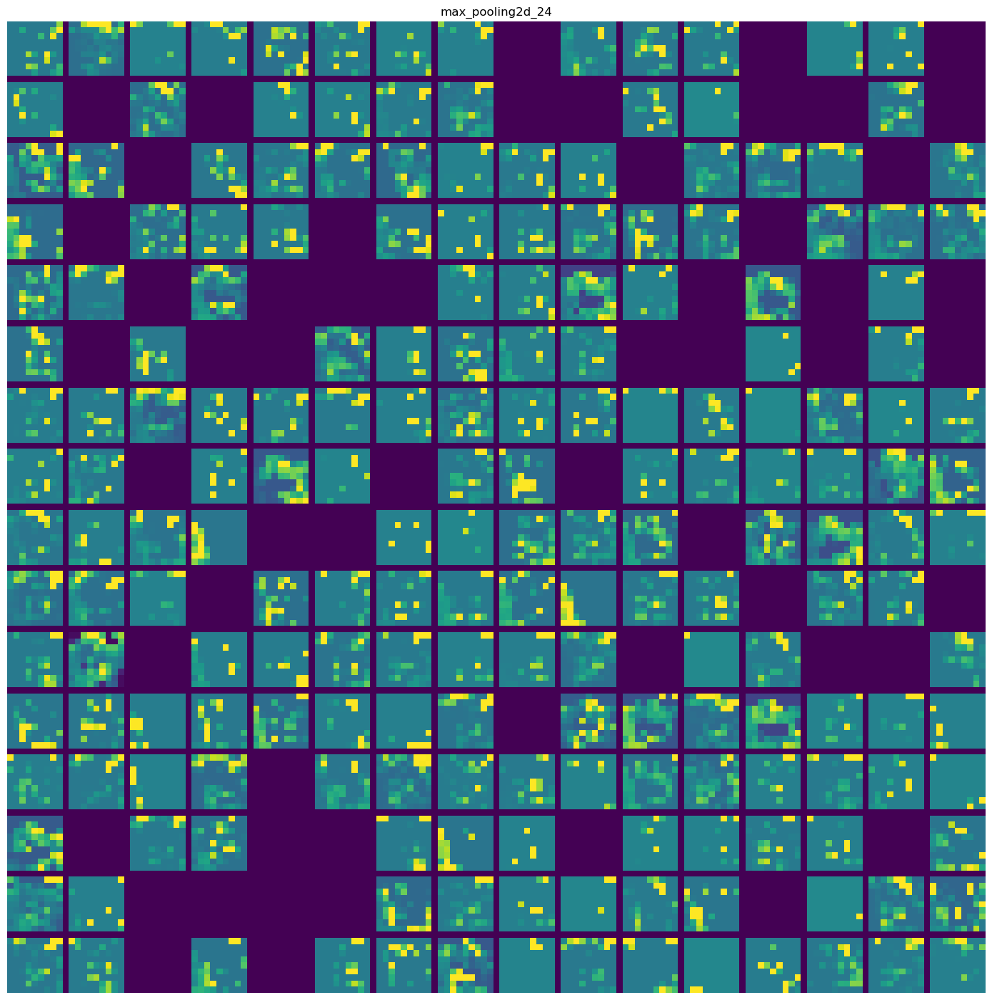

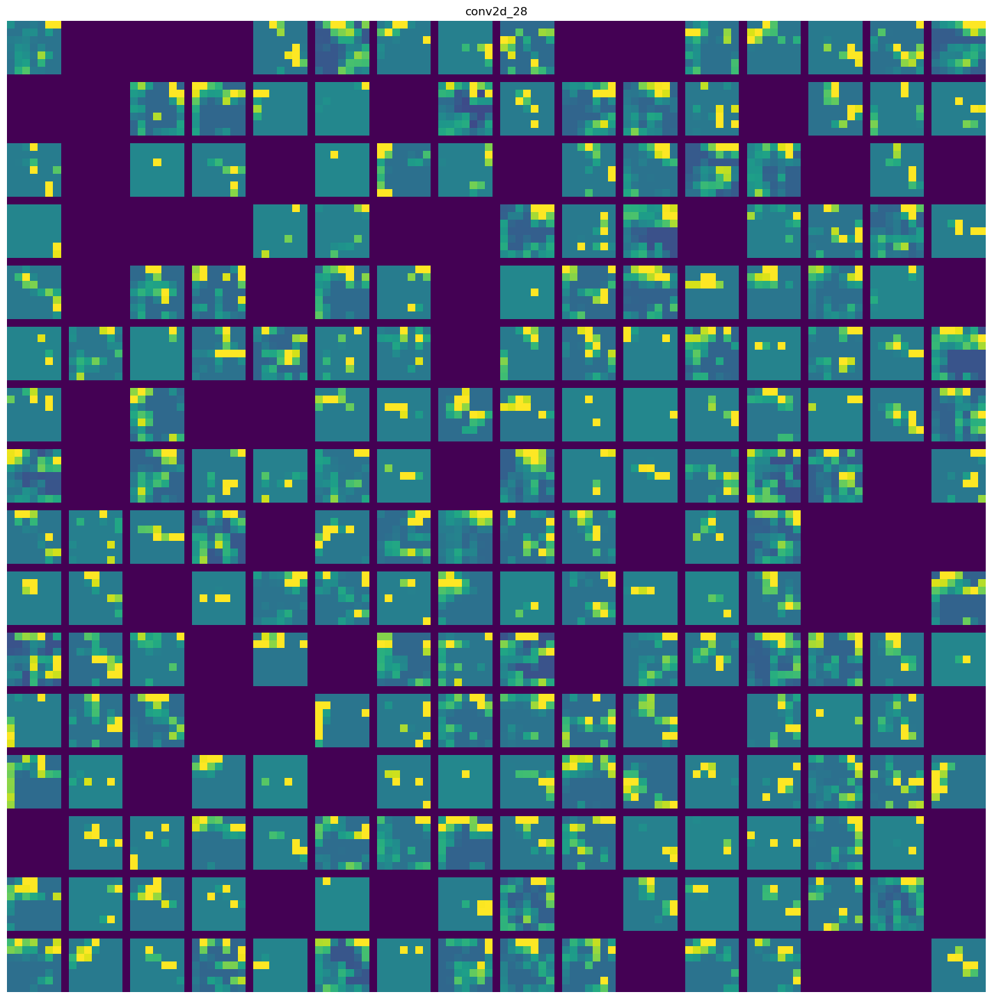

In [255]:
images_per_row = 16 
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

In [256]:
model = keras.applications.xception.Xception(
    weights="imagenet",
    include_top=False)

83683744/83683744 [==============================] - 24s 0us/step


In [257]:
for layer in model.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.SeparableConv2D)):
        print(layer.name)

block1_conv1
block1_conv2
block2_sepconv1
block2_sepconv2
conv2d_266
block3_sepconv1
block3_sepconv2
conv2d_267
block4_sepconv1
block4_sepconv2
conv2d_268
block5_sepconv1
block5_sepconv2
block5_sepconv3
block6_sepconv1
block6_sepconv2
block6_sepconv3
block7_sepconv1
block7_sepconv2
block7_sepconv3
block8_sepconv1
block8_sepconv2
block8_sepconv3
block9_sepconv1
block9_sepconv2
block9_sepconv3
block10_sepconv1
block10_sepconv2
block10_sepconv3
block11_sepconv1
block11_sepconv2
block11_sepconv3
block12_sepconv1
block12_sepconv2
block12_sepconv3
block13_sepconv1
block13_sepconv2
conv2d_269
block14_sepconv1
block14_sepconv2


In [299]:
layer_name = "block13_sepconv2"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

In [300]:
activation = feature_extractor(
    keras.applications.xception.preprocess_input(img_tensor)
)

In [301]:
activation.shape

TensorShape([1, 11, 11, 1024])

In [302]:
activation[:, 2:-2, 2:-2, 3]

<tf.Tensor: shape=(1, 7, 7), dtype=float32, numpy=
array([[[ 0.123326  ,  0.05244724,  0.06682333, -0.01249772,
          0.01857966,  0.01061391,  0.12777255],
        [-0.02471663, -0.18212828, -0.1702188 , -0.23727804,
         -0.21126974, -0.17344195,  0.00996111],
        [ 0.01740547, -0.18858927, -0.13921443, -0.21332578,
         -0.18299083, -0.15463239,  0.03968003],
        [ 0.03905855, -0.11894579, -0.06462628, -0.14204702,
         -0.14619747, -0.11322285,  0.08324335],
        [ 0.06306456, -0.05903342, -0.00784006, -0.06918678,
         -0.08304853, -0.06450391,  0.09307495],
        [ 0.02264093, -0.0425605 , -0.02244468, -0.10021009,
         -0.1228511 , -0.07458851,  0.07494465],
        [ 0.07363647,  0.07735538,  0.06721599, -0.01677161,
         -0.01887133,  0.05537103,  0.16665363]]], dtype=float32)>

In [303]:
import tensorflow as tf
  
def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

In [304]:
compute_loss(img_tensor, 4)

<tf.Tensor: shape=(), dtype=float32, numpy=-0.05248819>

In [305]:
@tf.function 
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)
    image += learning_rate * grads
    return image

In [306]:
img_width = 200 
img_height = 200 
  
def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0].numpy()

In [307]:
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

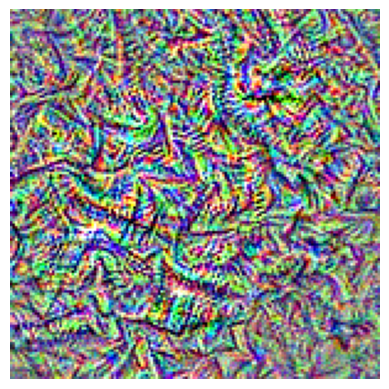

In [308]:
plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))

In [309]:
all_images = []
for filter_index in range(64):
    print(f"Processing filter {filter_index}")
    image = deprocess_image(
        generate_filter_pattern(filter_index)
    )
    all_images.append(image)
  
margin = 5
n = 8 
cropped_width = img_width - 25 * 2 
cropped_height = img_height - 25 * 2 
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))
  
for i in range(n):
    for j in range(n):
        image = all_images[i * n + j]
        # stitched_filters[
        row_start = (cropped_width + margin) * i
        row_end = (cropped_width + margin) * i + cropped_width
        column_start = (cropped_height + margin) * j
        column_end = (cropped_height + margin) * j + cropped_height
 
        stitched_filters[
            row_start: row_end,
            column_start: column_end, :] = image
  
keras.utils.save_img(
    f"filters_for_layer_{layer_name}.png", stitched_filters)

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24
Processing filter 25
Processing filter 26
Processing filter 27
Processing filter 28
Processing filter 29
Processing filter 30
Processing filter 31
Processing filter 32
Processing filter 33
Processing filter 34
Processing filter 35
Processing filter 36
Processing filter 37
Processing filter 38
Processing filter 39
Processing filter 40
Processing filter 41
Processing filter 42
Processing filter 43
Processing filter 44
Processing filter 45
Processing filter 46
Processing filter 47
Pr

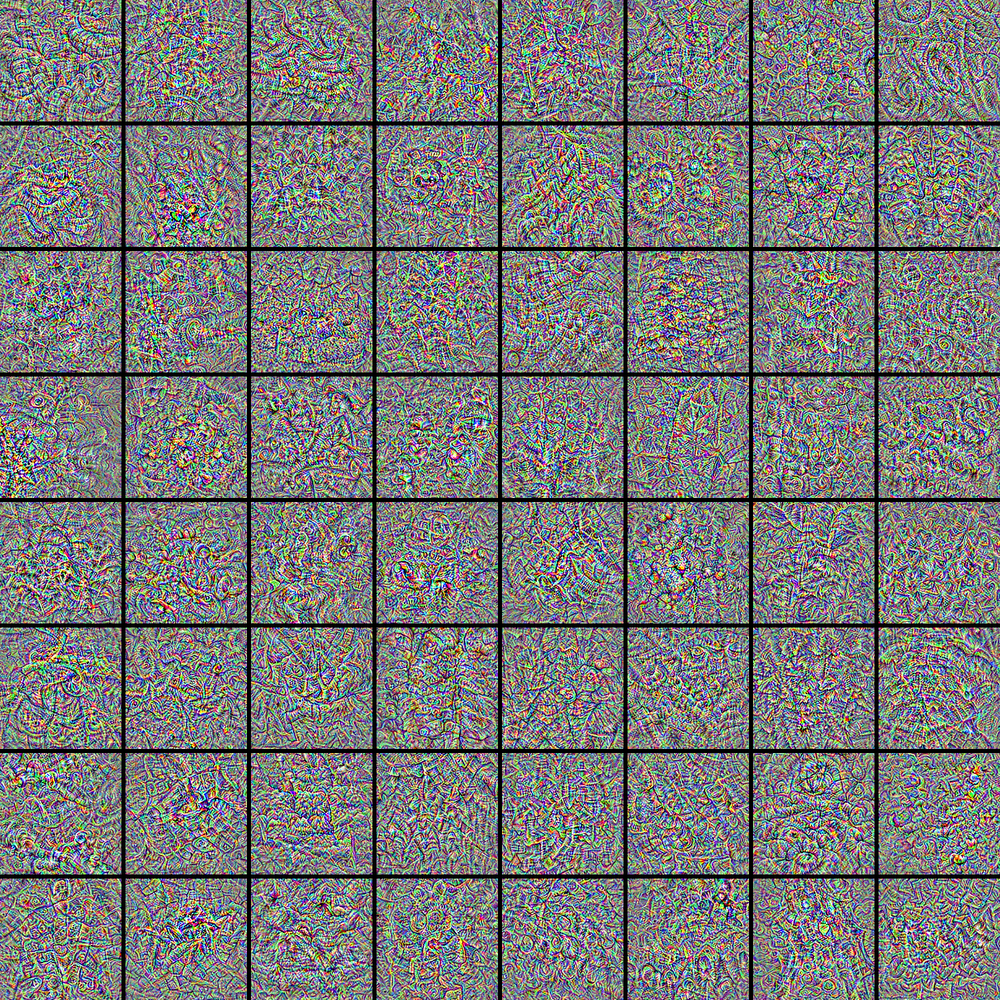

In [310]:
keras.utils.load_img(f'filters_for_layer_{layer_name}.png')

In [311]:
model = keras.applications.xception.Xception(weights="imagenet")

91884032/91884032 [==============================] - 23s 0us/step


In [312]:
img_path = keras.utils.get_file(
    fname="elephant.jpg",
    origin="https://img-datasets.s3.amazonaws.com/elephant.jpg")
 
def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    array = keras.applications.xception.preprocess_input(array)
    return array
 
img_array = get_img_array(img_path, target_size=(299, 299))

733657/733657 [==============================] - 1s 1us/step


In [313]:
preds = model.predict(img_array)
print(keras.applications.xception.decode_predictions(preds, top=3)[0])

35363/35363 [==============================] - 0s 0us/step
[('n02504458', 'African_elephant', 0.8700634), ('n01871265', 'tusker', 0.076853484), ('n02504013', 'Indian_elephant', 0.023551809)]


In [314]:
np.argmax(preds[0])

386

In [315]:
last_conv_layer_name = "block14_sepconv2_act" 
classifier_layer_names = [
    "avg_pool",
    "predictions",
]
last_conv_layer = model.get_layer(last_conv_layer_name)
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

In [316]:
classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input 
for layer_name in classifier_layer_names:
    x = model.get_layer(layer_name)(x)
classifier_model = keras.Model(classifier_input, x)

In [317]:
import tensorflow as tf
  
with tf.GradientTape() as tape:
    last_conv_layer_output = last_conv_layer_model(img_array)
    tape.watch(last_conv_layer_output)
    preds = classifier_model(last_conv_layer_output)
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, top_pred_index]
 
grads = tape.gradient(top_class_channel, last_conv_layer_output)

In [318]:
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()
last_conv_layer_output = last_conv_layer_output.numpy()[0]
for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]
heatmap = np.mean(last_conv_layer_output, axis=-1)

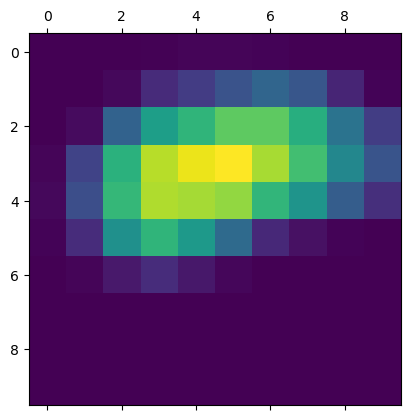

In [319]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [320]:
import matplotlib.cm as cm
  
img = keras.utils.load_img(img_path)
img = keras.utils.img_to_array(img)
heatmap = np.uint8(255 * heatmap)
 
jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]
 
jet_heatmap = keras.utils.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = keras.utils.img_to_array(jet_heatmap)
 
superimposed_img = jet_heatmap * 0.4 + img
superimposed_img = keras.utils.array_to_img(superimposed_img)
 
save_path = "elephant_cam.jpg"
superimposed_img.save(save_path)

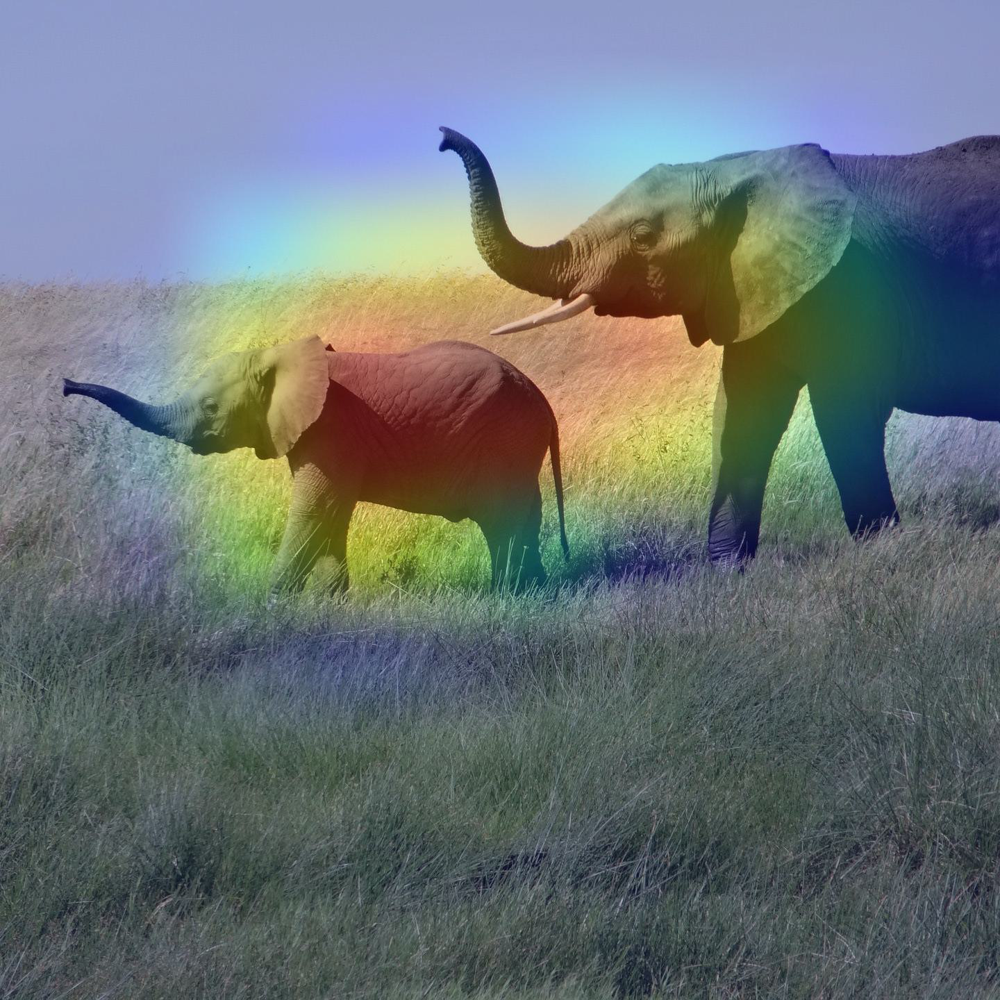

In [321]:
keras.utils.load_img('elephant_cam.jpg')